# CEGE0042 | Group project | 
## Traffic forecast

This document contains code and results for traffic speed forecasting. Using a `long short-term memory` (LSTM) algorhithm

**Inputs:**
- Data from R processing script
- External packages (listed below)

**Outputs:**
- Trained model(s)
- Data visualisations
- Model Key Performance Indicators for comparison

**Contributors:** [Chloe Mow](https://github.com/chloemow) | [Hannah Ker](https://github.com/hannahker) | [Fu Yu](https://github.com/Connor666) | [Antonios Fiala](https://github.com/antoniosfiala) ||

## A | Import packages

In [4]:
#=== A.1 | Data processing
import numpy as np
import pandas as pd
import datetime
from datetimerange import DateTimeRange

#=== A.2 | Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

#=== A.3 | Tenserflow
import tensorflow as tf
from tensorflow import keras

#=== A.4 | Others
import math
import os
from timeit import default_timer as timer

Install packages here if you must

In [3]:
#pip install 

## B | Notebook settings

In [7]:
#=== B.1 | formating
# specifies number of rows to show
pd.set_option('display.max_rows', 300)

# specifies default number format to 4 decimal places
pd.options.display.float_format = '{:40,.4f}'.format 

#=== B.2 | random seed settings (for reproducibility)
random_seed = 10
np.random.seed(random_seed)
#tf.random.set_seed(random_seed) # If you have high version of tf
tf.set_random_seed(random_seed) # If you have low version of tf

## C | Read in data
Data pre-processed in R to extract from assignment-issued data package.

Time is arranged in 5 minute increments between the hours of 6am (1) to 9pm (180) across a date range of 01.01.2011 to 30.01.2011 (inclusive)

Reference for python date time formatting [here](https://www.w3schools.com/python/python_datetime.asp)

In [8]:
# Measuring start time
workflow_timer_start = timer()

In [9]:
#=== C.1 | specify file path (one level above where this file is)
file_location = "../2_data_split/traffic_speeds.csv"

# read in & preview data
loaded_data = pd.read_csv(file_location)
loaded_data.head()

,1745,1747,417,1878,1604,1620,1447,1622,1407,2357,...,2047,2344,433,434,446,447,452,453,Time,Date
0,0.0769,0.0845,0.2062,0.1057,0.1786,0.1268,0.1084,0.0915,0.2150,0.1261,...,0.1637,0.0931,0.1293,0.1420,0.1748,0.1307,0.1183,0.0818,1,2011-01-01
1,0.0847,0.0739,0.1635,0.1015,0.1850,0.1142,0.1125,0.0931,0.1878,0.1550,...,0.1736,0.1030,0.1425,0.1455,0.1879,0.1213,0.0986,0.1244,2,2011-01-01
2,0.0870,0.0786,0.1406,0.1182,0.1716,0.1016,0.1015,0.0946,0.1613,0.1483,...,0.1839,0.1156,0.1232,0.1342,0.1776,0.1411,0.1394,0.1031,3,2011-01-01
3,0.0874,0.0801,0.1765,0.1168,0.1894,0.1245,0.1386,0.0905,0.2072,0.1417,...,0.1938,0.1323,0.1375,0.1472,0.1767,0.1373,0.1028,0.0941,4,2011-01-01
4,0.0874,0.0872,0.1561,0.1307,0.1697,0.1158,0.1153,0.0966,0.2616,0.1343,...,0.1858,0.1103,0.1353,0.1289,0.1683,0.1407,0.1310,0.1087,5,2011-01-01


In [10]:
#=== C.2 | light data processing

# separate time columns
input_data = np.array(loaded_data.iloc[:,:-2])
time_columns = loaded_data.iloc[:,-2:]

In [11]:
#=== C.3 | time label settings
time_range_start = "T06:00:00"
time_range_end = "T20:55:00"

#=== C.4 | add full date time label to time data frame
# empty list to store values
time_labels = []

# Generate time labels series

for date in time_columns.Date.unique():
    
    time_range = DateTimeRange(f"{date}{time_range_start}", f"{date}{time_range_end}")
    for value in time_range.range(datetime.timedelta(minutes = 5)):
        #print(value)
        time_labels.append(value)

# Add new series to df
time_columns["Date_time"] = time_labels

In [12]:
#=== C.5 | presentation format for time series
time_columns["Date_time_show"] = time_columns["Date_time"].dt.strftime("%a (%d-%b) %H:%M")
time_columns.head()

,Time,Date,Date_time,Date_time_show
0,1,2011-01-01,2011-01-01 06:00:00,Sat (01-Jan) 06:00
1,2,2011-01-01,2011-01-01 06:05:00,Sat (01-Jan) 06:05
2,3,2011-01-01,2011-01-01 06:10:00,Sat (01-Jan) 06:10
3,4,2011-01-01,2011-01-01 06:15:00,Sat (01-Jan) 06:15
4,5,2011-01-01,2011-01-01 06:20:00,Sat (01-Jan) 06:20


### C | PLOT 1

Visualise a sample road, e.g. road at index 0 (id: 1745)

In [13]:
# define function
def f_plot_road_time(p_road_link_data):
    """Function docstring:"""
    
    global time_columns
    
    # road to plot
    road_plot_data = p_road_link_data
    road_name = road_plot_data.name
    road_date = time_columns["Date_time"].dt.strftime("%B %d %Y")
    road_plot_title = f"C | Plot | Road link {road_name} between {road_date.min()} and {road_date.max()}"

    # tick setup
    tick_positions = np.arange(0, 5400, 90)
    tick_labels = time_columns.Date_time_show[tick_positions]

    # plt set up
    plt.figure(figsize=(16, 4), dpi=300)
    plt.xticks(ticks = tick_positions,labels = tick_labels,rotation=90)
    plt.grid(color='gray', linestyle='-', linewidth=0.2)
    plt.title(road_plot_title,loc = "left")

    # highlight periods of interest
    weekend_positions = np.arange(0, 5400, 1260)
    for value in weekend_positions:
        plt.axvspan(value,value+360,facecolor='grey', edgecolor='none', alpha=0.15)

    # plt command
    plt.plot(time_columns["Date_time_show"], road_plot_data,linewidth = 0.5)

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


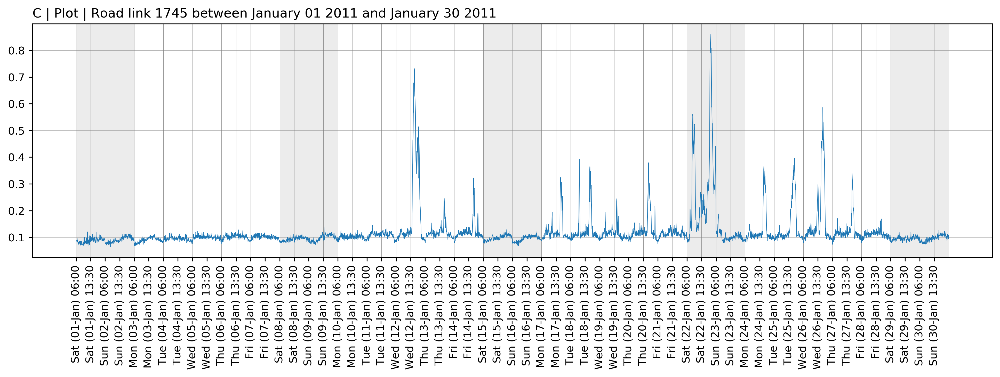

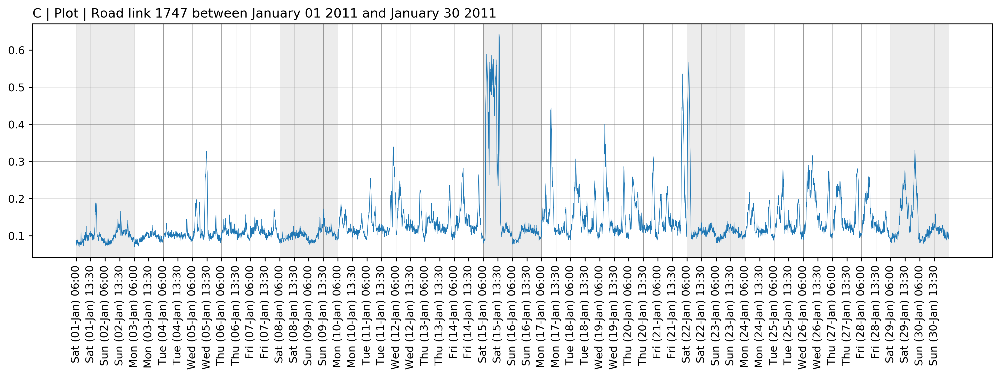

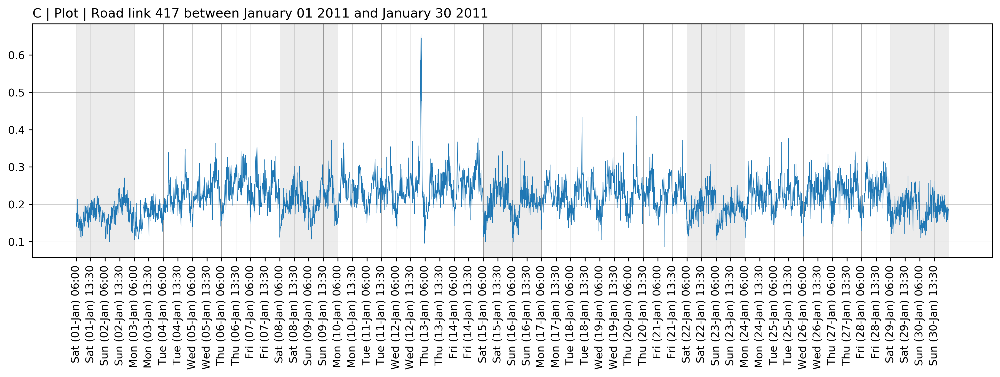

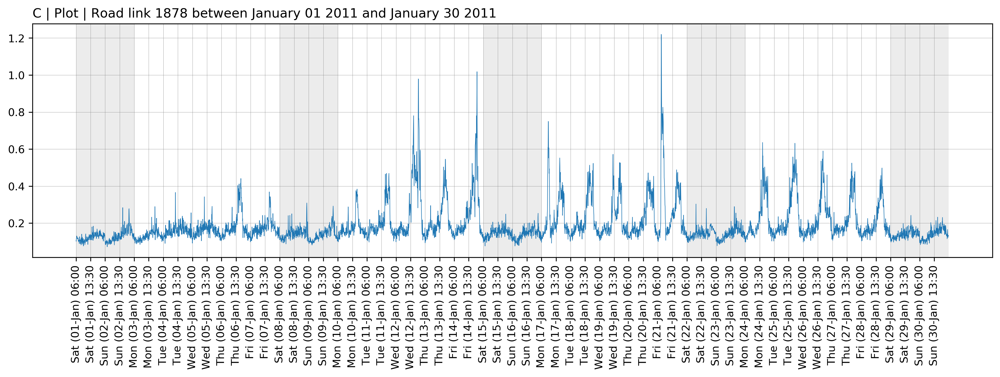

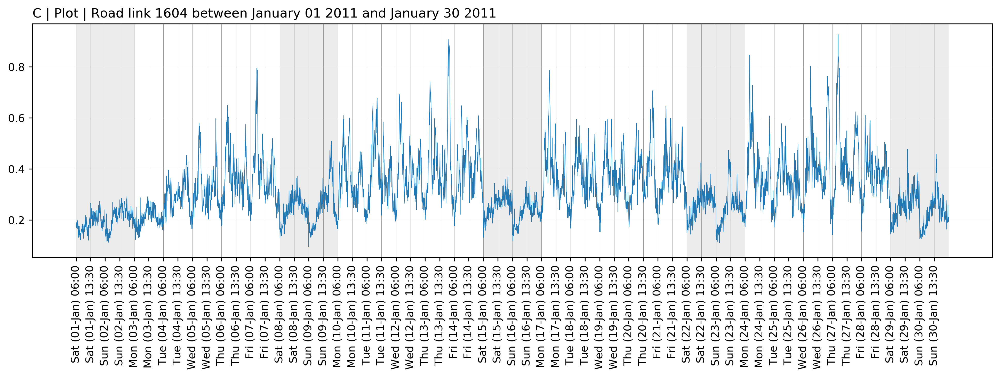

...

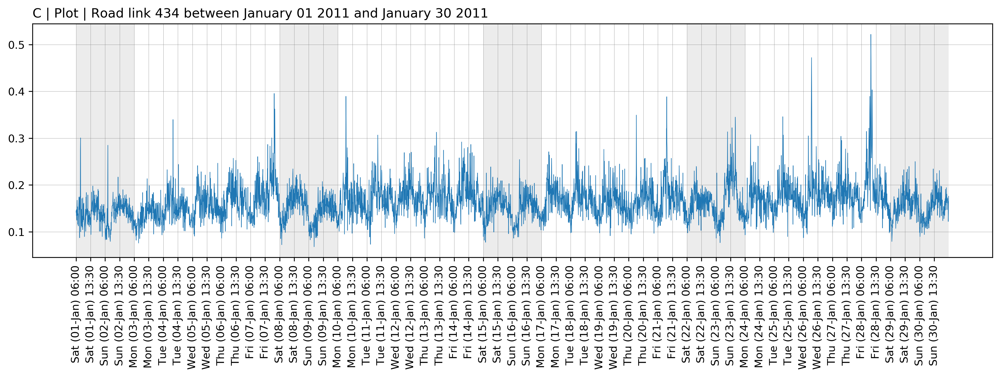

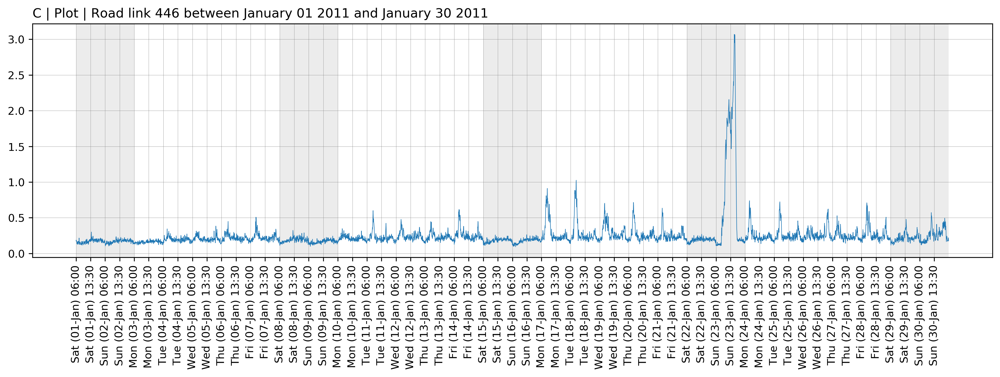

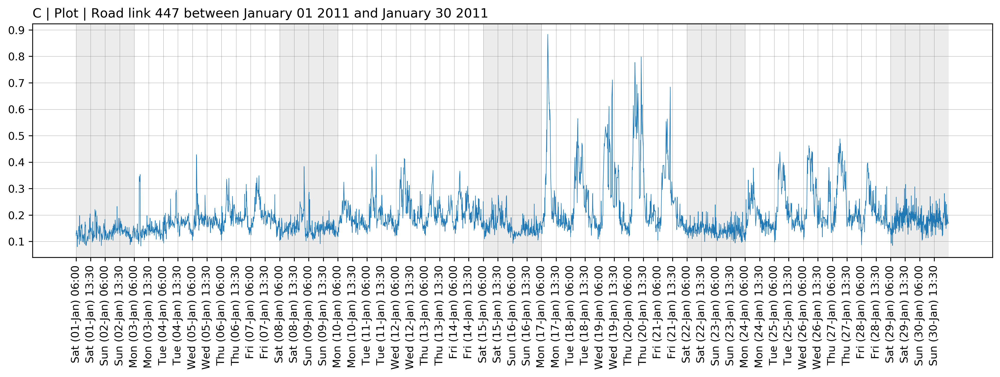

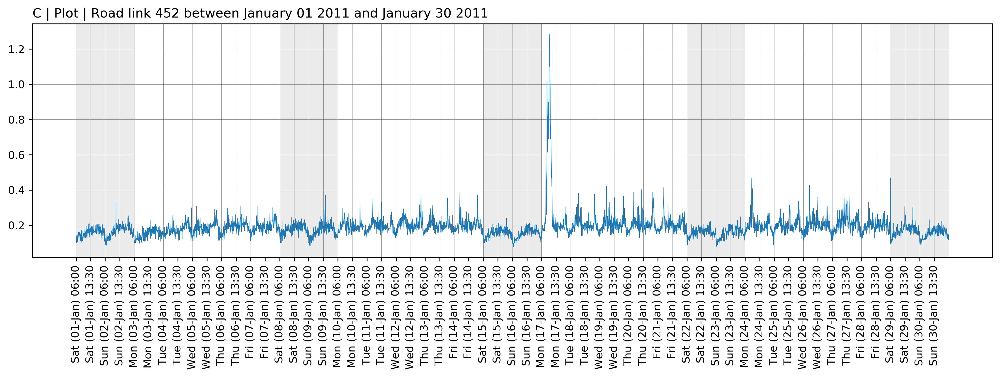

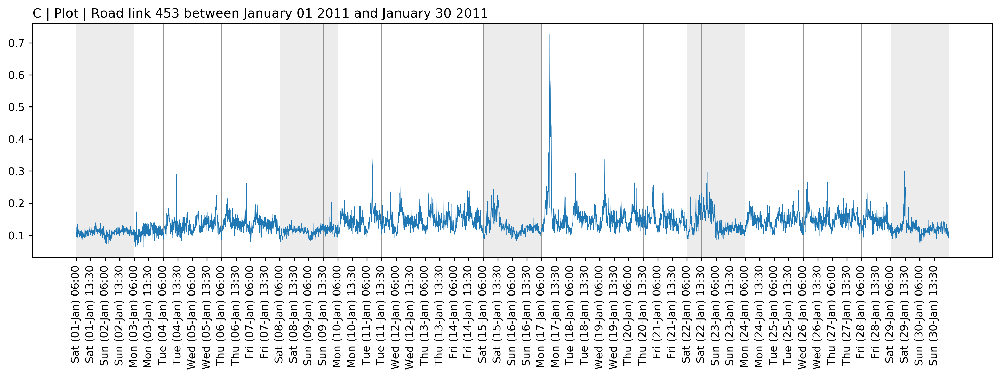

In [14]:
# take index for all road links in dataset
road_links = np.arange(0, loaded_data.shape[1]-2, 1)
# testing only
# road_links = np.arange(0, 3, 1)

# cycle through all road links to generate plot
for road in road_links:
    f_plot_road_time(loaded_data.iloc[:,road])
    
#[IMPROVE] SAVE PNG OUTPUTS

In [15]:
#=== C.6 | create function for dataset

#=== [COME_BACK] TO THIS AND EXPLAIN WHAT IS HAPPENING, especially with TIME_STEPS and with X and Y training data

def create_dataset(data, time_steps):
    Xs, ys = [], []
    for i in range(len(data)-time_steps):
        # Reshape data from (time_steps,) to (time_steps, 1)
        Xs.append(np.reshape(data[i:(i+time_steps)], (time_steps, 1)))
        ys.append(data[i+time_steps])

    return np.array(Xs), np.array(ys)

In [16]:
#=== C.7 | create an X and Y dataset

Xs=[]
ys=[]

for i in range(input_data.shape[1]):
    x, y = create_dataset(input_data[:,i], time_steps=10) # Read in each road data
    Xs.append(x)
    ys.append(y)
    
Xs=np.array(Xs)
ys=np.array(ys)

print('The shape of X is {}, and the shape of y is {}.'.format(Xs.shape, ys.shape))

#=== [COME_BACK] WHAT DO ELEMENTS WITH 10 ENTRIES DO?

The shape of X is (22, 5390, 10, 1), and the shape of y is (22, 5390).


In [17]:
input_data.shape

(5400, 22)

### C | Training, validation, test sets

In [18]:
#=== C.7 | create an X and Y dataset
train_days=23
step=180
X_train, y_train = Xs[:,:train_days*step], ys[:,:train_days*step]
X_test, y_test = Xs[:,train_days*step:], ys[:,train_days*step:]
print('The shape of training X is {}, and the shape of training y is {}.'.format(X_train.shape, y_train.shape))
print('The shape of testing X is {}, and the shape of testing y is {}.'.format(X_test.shape, y_test.shape))

The shape of training X is (22, 4140, 10, 1), and the shape of training y is (22, 4140).
The shape of testing X is (22, 1250, 10, 1), and the shape of testing y is (22, 1250).


## D | LSTM model

The idea is to train 22 roads as geographic infomation

In [21]:
def buildModel():

    #=== D.1 | build model
    model = keras.Sequential()

    # [add explain what's going on here]
    model.add(keras.layers.LSTM(
        units=128,
        input_shape=(X_train.shape[2], X_train.shape[3])
    ))
    model.add(keras.layers.Dense(units=1))

    #=== D.2 | Compile model with MSE error as the loss function & Adam optimiser & 0.001 as the learning rate
    model.compile(
        loss='mean_squared_error',
        optimizer=keras.optimizers.Adam(0.001)  
    )
    return model

In [23]:
#=== D.3 | Train model
# loss function lists
model=buildModel()
train_loss = []
validation_loss =[]

road_links_to_train = X_train.shape[0]

model_start_timer = timer()
# for loop to iterate 
for i in range(road_links_to_train):
    road_link_start_timer = timer()
    print("\n===================================")
    print(f"START | Train road link {i}")
    
    history = model.fit(
        X_train[i], y_train[i],
        epochs=35,
        batch_size=64,
        validation_split=0.1,
        verbose=1,
        shuffle=False
    )
    train_loss.append(history.history['loss'])
    validation_loss.append(history.history['val_loss'])
    address='model'+str(i)+'.h5'
    model.save(address)
    model=buildModel()
    
    road_link_end_timer = timer()
    
    print(f"\nENDED TRAINING | (road link {i})\n-----------------------------------\nTIME TO PROCESS LINK {road_link_end_timer-road_link_start_timer}")
    print("===================================")
    
model_end_timer = timer()    

# [COME_BACK] TODO init model
# [COME_BACK] ADD something that measures time
# [COME_BACK] THIS IS RUNNING A LONG BECAUSE THERE ARE 35 EPOCHS per ROAD LINK
print("\n\n===================================")
print(f"Time for training all models is {model_end_timer-model_start_timer}") # Time in seconds, e.g. 5.38091952400282
print("===================================")



START | Train road link 0
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 1s 300us/sample - loss: 0.0014 - val_loss: 0.0043
Epoch 2/35
3726/3726 [==============================] - 0s 126us/sample - loss: 6.7300e-04 - val_loss: 0.0037
Epoch 3/35
3726/3726 [==============================] - 0s 127us/sample - loss: 5.0060e-04 - val_loss: 0.0033
Epoch 4/35
3726/3726 [==============================] - 1s 139us/sample - loss: 4.9903e-04 - val_loss: 0.0030
Epoch 5/35
3726/3726 [==============================] - 1s 150us/sample - loss: 4.7148e-04 - val_loss: 0.0027
Epoch 6/35
3726/3726 [==============================] - 0s 123us/sample - loss: 4.4548e-04 - val_loss: 0.0024
Epoch 7/35
3726/3726 [==============================] - 1s 150us/sample - loss: 4.1841e-04 - val_loss: 0.0022
Epoch 8/35
3726/3726 [==============================] - 0s 131us/sample - loss: 3.9261e-04 - val_loss: 0.0021
Epoch 9/35
3726/3726 [============================

3726/3726 [==============================] - 0s 129us/sample - loss: 2.1950e-04 - val_loss: 2.9962e-04

ENDED TRAINING | (road link 1)
-----------------------------------
TIME TO PROCESS LINK 19.685557500000016

START | Train road link 2
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 1s 317us/sample - loss: 0.0025 - val_loss: 0.0012
Epoch 2/35
3726/3726 [==============================] - 0s 132us/sample - loss: 0.0013 - val_loss: 0.0011
Epoch 3/35
3726/3726 [==============================] - 0s 130us/sample - loss: 0.0013 - val_loss: 0.0012
Epoch 4/35
3726/3726 [==============================] - 0s 131us/sample - loss: 0.0013 - val_loss: 0.0013
Epoch 5/35
3726/3726 [==============================] - 0s 131us/sample - loss: 0.0012 - val_loss: 0.0013
Epoch 6/35
3726/3726 [==============================] - 0s 130us/sample - loss: 0.0012 - val_loss: 0.0012
Epoch 7/35
3726/3726 [==============================] - 0s 133us/sample - loss:

3726/3726 [==============================] - 1s 149us/sample - loss: 0.0014 - val_loss: 8.2181e-04
Epoch 35/35
3726/3726 [==============================] - 1s 147us/sample - loss: 0.0014 - val_loss: 8.2251e-04

ENDED TRAINING | (road link 3)
-----------------------------------
TIME TO PROCESS LINK 21.187740399999996

START | Train road link 4
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 1s 378us/sample - loss: 0.0066 - val_loss: 0.0024
Epoch 2/35
3726/3726 [==============================] - 1s 139us/sample - loss: 0.0049 - val_loss: 0.0036
Epoch 3/35
3726/3726 [==============================] - 1s 140us/sample - loss: 0.0044 - val_loss: 0.0027
Epoch 4/35
3726/3726 [==============================] - 1s 154us/sample - loss: 0.0035 - val_loss: 0.0020
Epoch 5/35
3726/3726 [==============================] - 1s 158us/sample - loss: 0.0031 - val_loss: 0.0019
Epoch 6/35
3726/3726 [==============================] - 1s 157us/sample - loss

3726/3726 [==============================] - 1s 158us/sample - loss: 0.0013 - val_loss: 9.8397e-04

ENDED TRAINING | (road link 5)
-----------------------------------
TIME TO PROCESS LINK 23.094337499999995

START | Train road link 6
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 2s 435us/sample - loss: 0.0041 - val_loss: 0.0019
Epoch 2/35
3726/3726 [==============================] - ETA: 0s - loss: 0.002 - 1s 155us/sample - loss: 0.0031 - val_loss: 0.0017
Epoch 3/35
3726/3726 [==============================] - 1s 156us/sample - loss: 0.0026 - val_loss: 9.0006e-04
Epoch 4/35
3726/3726 [==============================] - 1s 154us/sample - loss: 0.0024 - val_loss: 8.5265e-04
Epoch 5/35
3726/3726 [==============================] - 1s 168us/sample - loss: 0.0024 - val_loss: 8.8512e-04
Epoch 6/35
3726/3726 [==============================] - 1s 171us/sample - loss: 0.0023 - val_loss: 8.7314e-04
Epoch 7/35
3726/3726 [=====================

3726/3726 [==============================] - 1s 181us/sample - loss: 5.0388e-04 - val_loss: 6.0989e-04
Epoch 34/35
3726/3726 [==============================] - 1s 178us/sample - loss: 5.0340e-04 - val_loss: 6.1061e-04
Epoch 35/35
3726/3726 [==============================] - 1s 178us/sample - loss: 5.0301e-04 - val_loss: 6.1132e-04

ENDED TRAINING | (road link 7)
-----------------------------------
TIME TO PROCESS LINK 26.542878799999983

START | Train road link 8
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 2s 505us/sample - loss: 0.0051 - val_loss: 0.0023
Epoch 2/35
3726/3726 [==============================] - 1s 166us/sample - loss: 0.0028 - val_loss: 0.0022
Epoch 3/35
3726/3726 [==============================] - 1s 151us/sample - loss: 0.0025 - val_loss: 0.0022
Epoch 4/35
3726/3726 [==============================] - 1s 150us/sample - loss: 0.0024 - val_loss: 0.0021
Epoch 5/35
3726/3726 [==============================] - 1s 16

Epoch 35/35
3726/3726 [==============================] - 1s 180us/sample - loss: 0.0018 - val_loss: 0.0114

ENDED TRAINING | (road link 9)
-----------------------------------
TIME TO PROCESS LINK 26.556896499999993

START | Train road link 10
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 2s 560us/sample - loss: 0.0015 - val_loss: 8.9782e-04
Epoch 2/35
3726/3726 [==============================] - 1s 180us/sample - loss: 0.0013 - val_loss: 0.0014
Epoch 3/35
3726/3726 [==============================] - 1s 185us/sample - loss: 0.0012 - val_loss: 0.0011
Epoch 4/35
3726/3726 [==============================] - 1s 183us/sample - loss: 0.0011 - val_loss: 9.6871e-04
Epoch 5/35
3726/3726 [==============================] - 1s 176us/sample - loss: 0.0010 - val_loss: 9.3100e-04
Epoch 6/35
3726/3726 [==============================] - 1s 172us/sample - loss: 0.0010 - val_loss: 9.0026e-04
Epoch 7/35
3726/3726 [==============================] - 1s

3726/3726 [==============================] - 1s 196us/sample - loss: 8.7931e-04 - val_loss: 9.4078e-04
Epoch 34/35
3726/3726 [==============================] - 1s 195us/sample - loss: 8.7932e-04 - val_loss: 9.4068e-04
Epoch 35/35
3726/3726 [==============================] - 1s 212us/sample - loss: 8.7937e-04 - val_loss: 9.4056e-04

ENDED TRAINING | (road link 11)
-----------------------------------
TIME TO PROCESS LINK 28.64635839999994

START | Train road link 12
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 3s 697us/sample - loss: 0.0054 - val_loss: 0.0027
Epoch 2/35
3726/3726 [==============================] - 1s 220us/sample - loss: 0.0039 - val_loss: 0.0033
Epoch 3/35
3726/3726 [==============================] - 1s 208us/sample - loss: 0.0038 - val_loss: 0.0032
Epoch 4/35
3726/3726 [==============================] - 1s 207us/sample - loss: 0.0037 - val_loss: 0.0030
Epoch 5/35
3726/3726 [==============================] - 1s 2

3726/3726 [==============================] - 1s 234us/sample - loss: 0.0051 - val_loss: 0.0077
Epoch 35/35
3726/3726 [==============================] - 1s 221us/sample - loss: 0.0051 - val_loss: 0.0077

ENDED TRAINING | (road link 13)
-----------------------------------
TIME TO PROCESS LINK 34.00211550000006

START | Train road link 14
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 3s 719us/sample - loss: 0.0026 - val_loss: 9.4126e-04
Epoch 2/35
3726/3726 [==============================] - 1s 234us/sample - loss: 9.8613e-04 - val_loss: 6.7674e-04
Epoch 3/35
3726/3726 [==============================] - 1s 234us/sample - loss: 8.5645e-04 - val_loss: 4.9764e-04
Epoch 4/35
3726/3726 [==============================] - 1s 234us/sample - loss: 7.6665e-04 - val_loss: 4.3087e-04
Epoch 5/35
3726/3726 [==============================] - 1s 233us/sample - loss: 7.0987e-04 - val_loss: 4.0244e-04
Epoch 6/35
3726/3726 [===========================

3726/3726 [==============================] - 1s 243us/sample - loss: 4.8669e-04 - val_loss: 0.0012
Epoch 32/35
3726/3726 [==============================] - 1s 249us/sample - loss: 4.8560e-04 - val_loss: 0.0012
Epoch 33/35
3726/3726 [==============================] - 1s 252us/sample - loss: 4.8572e-04 - val_loss: 0.0012
Epoch 34/35
3726/3726 [==============================] - 1s 247us/sample - loss: 4.8719e-04 - val_loss: 0.0012
Epoch 35/35
3726/3726 [==============================] - 1s 248us/sample - loss: 4.8647e-04 - val_loss: 0.0012

ENDED TRAINING | (road link 15)
-----------------------------------
TIME TO PROCESS LINK 36.11105989999999

START | Train road link 16
Train on 3726 samples, validate on 414 samples
Epoch 1/35
3726/3726 [==============================] - 3s 792us/sample - loss: 0.0026 - val_loss: 0.0017 loss: 0.00
Epoch 2/35
3726/3726 [==============================] - 1s 251us/sample - loss: 0.0011 - val_loss: 0.00120e- - ETA: 0s - loss: 5.
Epoch 3/35
3726/3726 [=====

3726/3726 [==============================] - 1s 258us/sample - loss: 8.2262e-04 - val_loss: 7.1082e-04
Epoch 25/35
3726/3726 [==============================] - 1s 257us/sample - loss: 8.2033e-04 - val_loss: 7.0761e-04
Epoch 26/35
3726/3726 [==============================] - 1s 259us/sample - loss: 8.1835e-04 - val_loss: 7.0476e-04
Epoch 27/35
3726/3726 [==============================] - 1s 258us/sample - loss: 8.1665e-04 - val_loss: 7.0223e-04
Epoch 28/35
3726/3726 [==============================] - 1s 259us/sample - loss: 8.1520e-04 - val_loss: 6.9999e-04 loss: 8.1475e-0
Epoch 29/35
3726/3726 [==============================] - ETA: 0s - loss: 8.1346e-04- ETA: 0s - loss: 7.9723e- - 1s 259us/sample - loss: 8.1394e-04 - val_loss: 6.9797e-04
Epoch 30/35
3726/3726 [==============================] - 1s 258us/sample - loss: 8.1293e-04 - val_loss: 6.9561e-04
Epoch 31/35
3726/3726 [==============================] - 1s 258us/sample - loss: 8.1087e-04 - val_loss: 6.9151e-04
Epoch 32/35
3726/3726

3726/3726 [==============================] - 1s 272us/sample - loss: 9.5112e-04 - val_loss: 6.3710e-04
Epoch 22/35
3726/3726 [==============================] - 1s 270us/sample - loss: 9.4336e-04 - val_loss: 6.4169e-04
Epoch 23/35
3726/3726 [==============================] - 1s 274us/sample - loss: 9.3766e-04 - val_loss: 6.4633e-04
Epoch 24/35
3726/3726 [==============================] - 1s 273us/sample - loss: 9.3379e-04 - val_loss: 6.5074e-04
Epoch 25/35
3726/3726 [==============================] - 1s 272us/sample - loss: 9.3141e-04 - val_loss: 6.5463e-04
Epoch 26/35
3726/3726 [==============================] - 1s 272us/sample - loss: 9.3016e-04 - val_loss: 6.5781e-04
Epoch 27/35
3726/3726 [==============================] - 1s 274us/sample - loss: 9.2970e-04 - val_loss: 6.6024e-04
Epoch 28/35
3726/3726 [==============================] - 1s 269us/sample - loss: 9.2976e-04 - val_loss: 6.6198e-04
Epoch 29/35
3726/3726 [==============================] - 1s 269us/sample - loss: 9.3018e-04 

3726/3726 [==============================] - 1s 308us/sample - loss: 4.7754e-04 - val_loss: 4.4301e-04
Epoch 20/35
3726/3726 [==============================] - 1s 308us/sample - loss: 4.7488e-04 - val_loss: 4.4180e-04
Epoch 21/35
3726/3726 [==============================] - 1s 309us/sample - loss: 4.7249e-04 - val_loss: 4.4075e-04
Epoch 22/35
3726/3726 [==============================] - 1s 306us/sample - loss: 4.7035e-04 - val_loss: 4.3986e-04
Epoch 23/35
3726/3726 [==============================] - 1s 308us/sample - loss: 4.6841e-04 - val_loss: 4.3910e-04
Epoch 24/35
3726/3726 [==============================] - 1s 311us/sample - loss: 4.6667e-04 - val_loss: 4.3845e-04
Epoch 25/35
3726/3726 [==============================] - 1s 308us/sample - loss: 4.6511e-04 - val_loss: 4.3789e-04
Epoch 26/35
3726/3726 [==============================] - 1s 309us/sample - loss: 4.6371e-04 - val_loss: 4.3740e-04
Epoch 27/35
3726/3726 [==============================] - 1s 316us/sample - loss: 4.6246e-04 

In [24]:
#=== D.4 | Capture loss functions in arrays for each road link

train_loss=np.array(train_loss)
validation_loss=np.array(validation_loss)

# Calculate means for each road link
train_loss_mean=np.mean(train_loss,axis=0)
validation_loss_meam=np.mean(validation_loss,axis=0)

print("Train loss mean:\n",train_loss_mean)
print("Validation loss mean:\n",validation_loss_meam)

# [COME_BACK] WHY DO WE HAVE 35 means and 22 road links?

Train loss mean:
 [0.00356986 0.00225236 0.00202745 0.0018782  0.00179134 0.00172023
 0.00164921 0.00159676 0.00153623 0.00149596 0.00145427 0.00142778
 0.00139674 0.00137935 0.00135727 0.00134566 0.00133012 0.00132156
 0.00131063 0.00130443 0.00129637 0.00129177 0.00128547 0.00128282
 0.00127802 0.00127687 0.00127277 0.00127279 0.00127    0.00127171
 0.00126845 0.00126803 0.0012655  0.00126468 0.00126201]
Validation loss mean:
 [0.00625096 0.00452161 0.00376033 0.00339177 0.0031158  0.00283737
 0.00262057 0.0024561  0.00233819 0.00226994 0.00223463 0.00222926
 0.0022214  0.00221519 0.00219356 0.00217139 0.00214642 0.00212579
 0.00211035 0.00209097 0.00207514 0.00205348 0.00203578 0.0020131
 0.00199501 0.00198242 0.0019769  0.00197498 0.00197216 0.00196172
 0.00194801 0.00192443 0.00190936 0.00188921 0.00188721]


### D | Plot 1

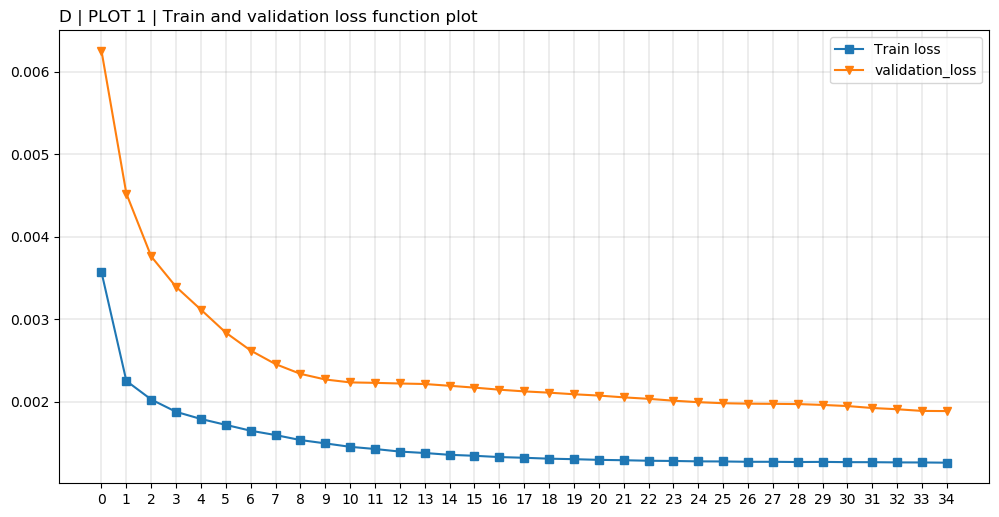

In [26]:
#=== D.5 | Visualise loss functions for each road-link
plt.figure(figsize=(12, 6), dpi=100)
plt.title(f"D | PLOT 1 | Train and validation loss function plot",loc = "left")
plt.plot(train_loss_mean, label='Train loss',marker = "s")
plt.plot(validation_loss_meam, label='validation_loss', marker = "v")
plt.xticks(ticks = list(range(0,len(train_loss_mean),1)))
plt.grid(color='gray', linestyle='-', linewidth=0.2, which = "both")
plt.legend()

In [27]:
#=== D.6 | predict test data for each road
result_LSTM=[]

model_training_start_timer = timer()

# for every road link, load model (with address), predict test data and append results to list
for i in range(X_train.shape[0]):
    address='model'+str(i)+'.h5'
    model=keras.models.load_model(address)
    y_predLSTM = model.predict(X_test[i]) #Predict result of each road
    result_LSTM.append(y_predLSTM)
    
model_training_end_timer = timer()
time_lapsed = model_training_end_timer - model_training_start_timer
print(f"Time elapsed predicting values: {time_lapsed}")

result_LSTM=np.array(result_LSTM)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Time elapsed predicting values: 169.47118869999986


### MSE and R2

RF has better performance in MSE, and LSTM have better performance in R2. The reason is RF may have betther performance in high value model, in this case, R2 is employed to evaluate the performance from different models. LSTM has higher R2, and LSTM is better than RF in solving this question (follow our assumetion).

In [37]:
from sklearn.metrics import mean_squared_error

mse_LSTM=[]

for i in range (result_LSTM.shape[0]):
    mse_LSTM.append(mean_squared_error(result_LSTM[i],y_test[i]))
    
print('LSTM:',np.mean(mse_LSTM))

LSTM: 0.0015751860454817452


In [38]:
from sklearn.metrics import r2_score

R2_LSTM=[]

for i in range (result_LSTM.shape[0]):
    R2_LSTM.append(r2_score(result_LSTM[i],y_test[i]))
    
print('LSTM:',np.mean(R2_LSTM))

LSTM: 0.35098959919165706


### D | Plot 2

Function and running of function to show true and predicted values in the style of plot C1

In [30]:
# define function
def f_plot_predicted_road_time(p_road_link_index,p_xlim = (0,5400),p_ylim = (0,0.8), p_tick_every = 90):
    """Function docstring:"""
    
    global time_columns
    global y_train
    global y_test
    global result_LSTM
        
    # road to plot
    road_index = p_road_link_index
    road_date = time_columns["Date_time"].dt.strftime("%B %d %Y, %H:%M")
    road_plot_title = f"C | Plot | Road link at index {road_index} between {road_date[p_xlim[0]]} and {road_date[p_xlim[1]]}"

    # tick setup
    tick_positions = np.arange(0, 5400, p_tick_every)
    tick_labels = time_columns.Date_time_show[tick_positions]

    # plt set up
    plt.figure(figsize=(16, 4), dpi=300)
    plt.xticks(ticks = tick_positions,labels = tick_labels,rotation=90)
    plt.grid(color='gray', linestyle='-', linewidth=0.2)
    plt.title(road_plot_title,loc = "left")
    line_width = 0.5

    # highlight periods of interest
    weekend_positions = np.arange(0, 5400, 1260)
    for value in weekend_positions:
        plt.axvspan(value,value+360,facecolor='grey', edgecolor='none', alpha=0.15)

    # plt command
    plt.plot(y_train[road_index], label='historical data',linewidth = line_width)
    plt.plot(list(range(len(y_train[road_index]), len(y_train[road_index])+len(y_test[road_index]))), y_test[road_index], label='True values',linewidth = line_width)
    plt.plot(list(range(len(y_train[road_index]), len(y_train[road_index])+len(y_test[road_index]))), result_LSTM[road_index], label='Predicted values',linewidth = line_width)
    plt.legend()
    
    if p_ylim is None:
        plt.ylim(0,y_test[road_index].max()+0.05)
    else:
        plt.ylim(p_ylim[0],p_ylim[1])
        
    plt.xlim(p_xlim[0],p_xlim[1])

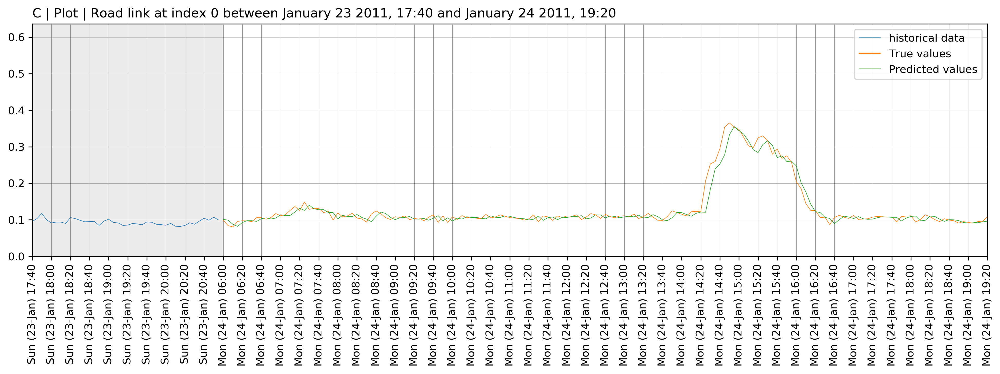

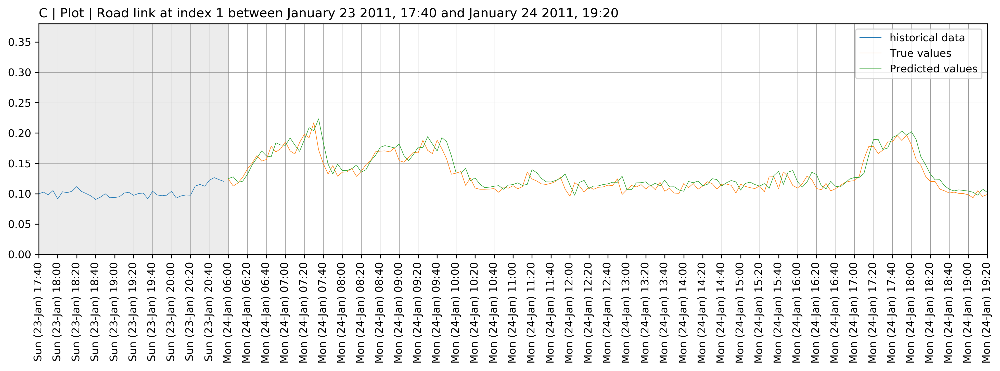

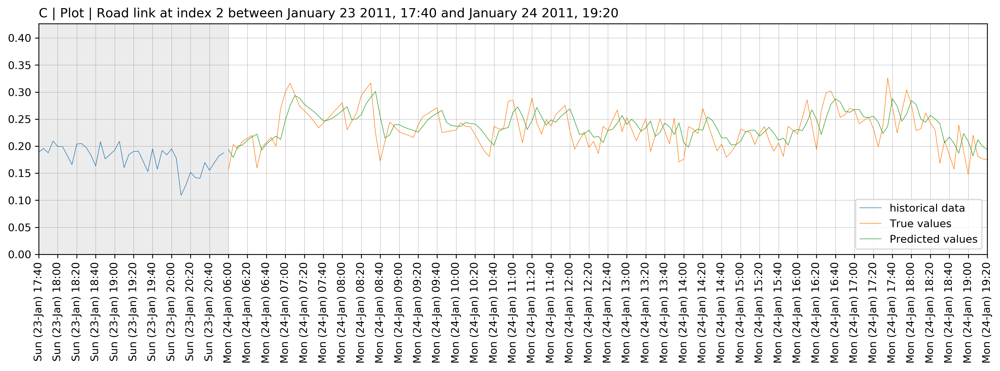

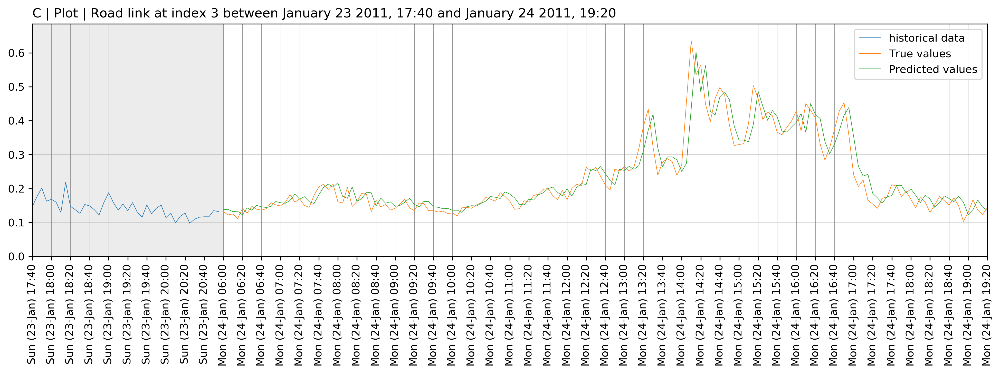

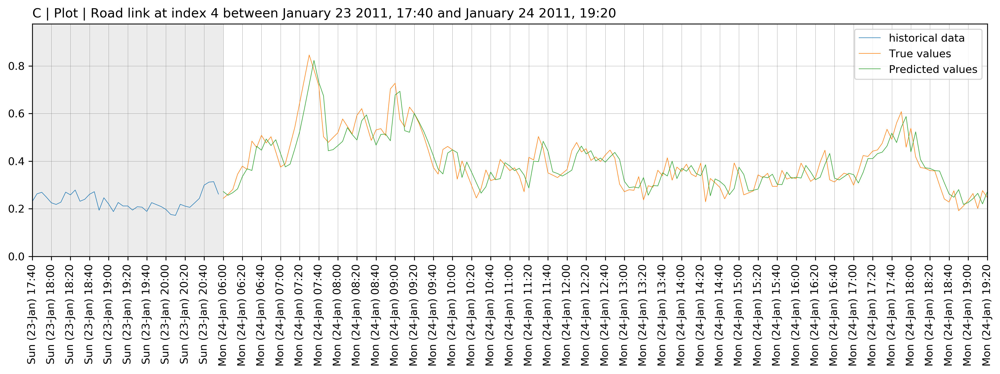

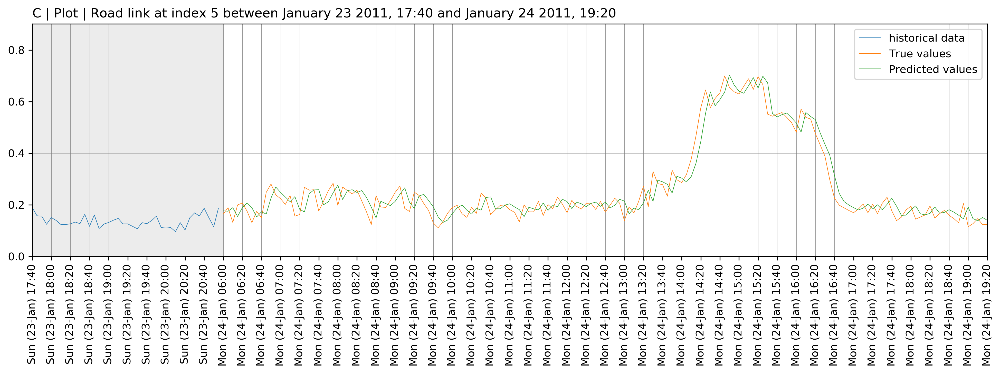

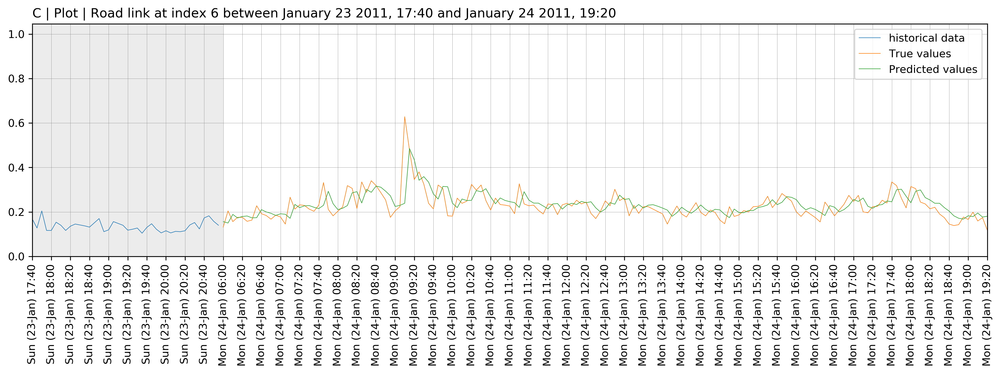

In [31]:
# run function on one road link
for value in list(range(0,7,1)):
    f_plot_predicted_road_time(p_road_link_index = value,
                               p_xlim=(4100,4300),
                               p_ylim = None,#(0,0.8),
                               p_tick_every = 4
                              )

### D | Plot 3

Heatmap visualisation

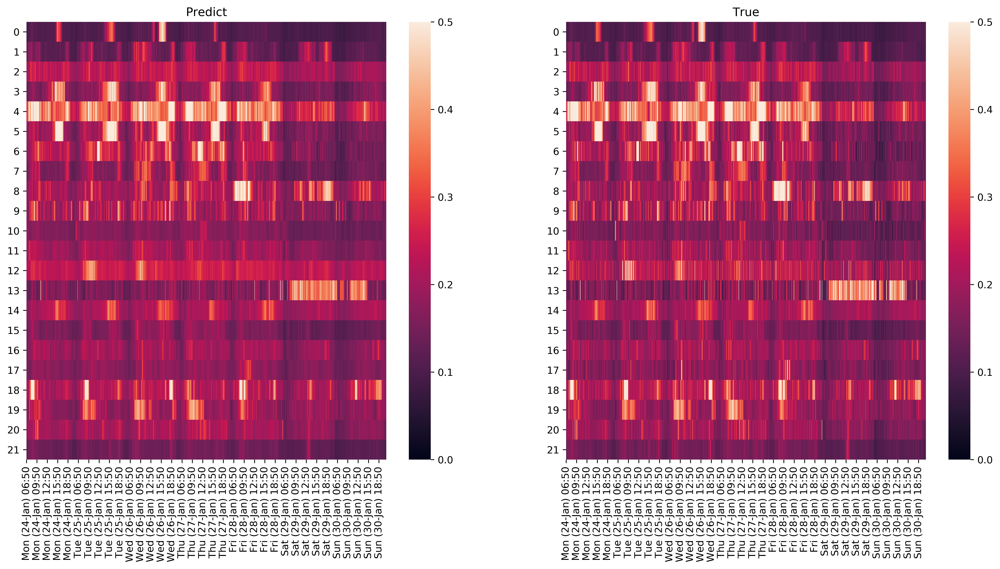

In [32]:
# Preparation of heatmap
heatmap_LSTM=result_LSTM.reshape(22,-1)

# Time ticks
tick_frequency = 36 # every 3 hours
tick_positions = np.arange(0, heatmap_LSTM.shape[1], tick_frequency)
# Take slice of time dataframe based on length of test data in heatmap_LSTM, 
# reset the index and then sample the required tick positions
tick_labels = time_columns.Date_time_show[-heatmap_LSTM.shape[1]:].reset_index(drop=True)[tick_positions]

# Plot heatmap
fig = plt.figure(figsize=(18, 18), dpi = 450)
ax1=plt.subplot(2,2,1)
ax2=plt.subplot(2,2,2)

plt.sca(ax1)
plt.title('Predict')
sns_plot_pre = sns.heatmap(heatmap_LSTM,vmin=0,vmax=0.5)
plt.xticks(ticks = tick_positions, labels = tick_labels,rotation=90)
plt.yticks(rotation=0)
plt.ylim(22,0)

plt.sca(ax2)
plt.title('True')
sns_plot_test = sns.heatmap(y_test,vmin=0,vmax=0.5)
plt.xticks(ticks = tick_positions, labels = tick_labels,rotation=90)
plt.yticks(rotation=0)
plt.ylim(22,0)

plt.show()

## E | Workflow reporting

In [33]:
# Measuring end time
workflow_timer_end = timer()

In [34]:
# Report run time
workflow_time = (workflow_timer_end - workflow_timer_start)
print(f"Workflow took {workflow_time/60} minutes to run.")

Workflow took 25.48199512333333 minutes to run.
